In [1]:
import os
import pandas as pd
import alpaca_trade_api as tradeapi
from MCForecastTools import MCSimulation
from dotenv import load_dotenv
load_dotenv()

True

In [2]:
api_key = os.getenv("ALPACA_API_KEY")
secret_key = os.getenv("ALPACA_SECRET_KEY")

alpaca = tradeapi.REST(
    api_key,
    secret_key,
    api_version="v2"
)

In [4]:
df_ticker = alpaca.get_barset(
    ["KO","MSFT"],
    timeframe="1D",
    limit=1000
).df

df_ticker.head()

KO                ...   MSFT                   
                            open   high    low  ...    low  close      volume
time                                            ...                          
2017-04-18 00:00:00-04:00  43.11  43.59  43.09  ...    NaN    NaN         NaN
2017-04-19 00:00:00-04:00  43.74  43.79  43.19  ...    NaN    NaN         NaN
2017-04-20 00:00:00-04:00  43.20  43.30  43.05  ...  65.14  65.50  18229134.0
2017-04-21 00:00:00-04:00  42.98  43.10  42.89  ...  65.45  66.41  27485328.0
2017-04-24 00:00:00-04:00  43.24  43.43  43.15  ...  67.10  67.53  24937800.0

[5 rows x 10 columns]

In [5]:
?MCSimulation

Init signature:
MCSimulation(
    portfolio_data,
    weights='',
    num_simulation=1000,
    num_trading_days=252,
)
Docstring:     
A Python class for runnning Monte Carlo simulation on portfolio price data. 

...

Attributes
----------
portfolio_data : pandas.DataFrame
    portfolio dataframe
weights: list(float)
    portfolio investment breakdown
nSim: int
    number of samples in simulation
nTrading: int
    number of trading days to simulate
simulated_return : pandas.DataFrame
    Simulated data from Monte Carlo
confidence_interval : pandas.Series
    the 95% confidence intervals for simulated final cumulative returns
    
Init docstring:
Constructs all the necessary attributes for the MCSimulation object.

Parameters
----------
portfolio_data: pandas.DataFrame
    DataFrame containing stock price information from Alpaca API
weights: list(float)
    A list fractions representing percentage of total investment per stock. DEFAULT: Equal distribution
num_simulation: int
    Number 

In [17]:
MC_five_year = MCSimulation(
    portfolio_data=df_ticker,
    weights=[0.5,0.5],
    num_simulation=500,
    num_trading_days=5*252
)

In [18]:
MC_five_year.portfolio_data.head()

KO                ...   MSFT                         
                            open   high    low  ...  close      volume daily_return
time                                            ...                                
2017-04-18 00:00:00-04:00  43.11  43.59  43.09  ...    NaN         NaN          NaN
2017-04-19 00:00:00-04:00  43.74  43.79  43.19  ...    NaN         NaN          NaN
2017-04-20 00:00:00-04:00  43.20  43.30  43.05  ...  65.50  18229134.0          NaN
2017-04-21 00:00:00-04:00  42.98  43.10  42.89  ...  66.41  27485328.0     0.013893
2017-04-24 00:00:00-04:00  43.24  43.43  43.15  ...  67.53  24937800.0     0.016865

[5 rows x 12 columns]

In [19]:
MC_five_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.027011,0.994211,0.994488,1.007274,0.994279,0.985031,0.991105,1.003228,0.993281,1.010563,0.995242,0.987672,1.005708,0.997857,1.005207,1.005900,1.007214,1.008329,0.986094,0.999789,0.993334,1.003984,1.002843,1.009106,0.992471,0.986204,0.993407,0.999542,1.013097,1.007857,0.995277,0.992486,0.982463,1.001016,1.015399,1.016062,1.006502,0.995075,1.018293,1.029973,...,0.991642,1.002695,0.995888,1.002106,0.983522,0.983848,0.996752,0.980123,0.987881,1.003970,0.978313,1.032672,1.003695,1.023262,1.007647,1.002071,1.008927,0.982044,1.008101,1.024177,0.991900,0.989486,1.005570,1.001773,0.984381,1.010089,1.003393,1.027541,0.993359,1.004225,0.990234,0.979991,1.009165,1.010468,0.991981,1.009135,0.995809,0.994889,0.997568,0.989564
2,1.030638,0.993654,0.983607,1.016987,1.013514,0.973871,0.989257,0.993992,0.993154,1.004187,0.982966,0.987259,1.002384,0.981729,0.988095,0.994794,1.008097,1.000261,0.980257,0.999492,0.986042,1.000626,0.999957,0.978971,0.981901,0.979132,1.015205,0.998898,1.013568,1.004885,0.984766,1.013754,0.989310,1.012319,1.030465,1.028851,1.015595,0.988860,1.022975,1.028338,...,0.991282,0.997751,0.997621,1.022911,0.969144,0.992382,1.005586,0.978306,0.984511,1.019367,0.988662,1.035488,1.006425,1.031203,1.014935,1.006769,1.020058,0.991594,1.018528,1.015223,0.981034,0.982087,1.003073,0.996499,1.004414,1.024969,1.017162,1.036933,0.989971,0.996453,0.970914,0.968149,1.017606,1.014862,1.004902,0.984220,0.995551,1.001656,0.995879,0.969550
3,1.033107,1.016370,0.986424,1.020122,1.005326,0.980579,0.986941,1.001603,1.001487,1.012933,0.998437,0.992244,1.007213,0.978454,0.982344,1.001706,1.037877,0.987539,0.970466,0.991594,0.993704,0.996379,0.994865,0.998278,0.989115,0.975696,1.025821,1.007635,0.997050,1.027351,0.972033,1.003163,0.984294,1.024905,1.024084,1.044529,1.018309,0.984141,1.030642,1.030761,...,0.997656,0.994218,0.993406,1.044654,0.980918,1.006392,1.004905,0.975113,0.979785,1.030848,0.994923,1.055897,1.013457,1.037078,1.027586,1.013710,1.005138,0.987051,1.028955,1.021174,1.001145,0.970526,1.010803,1.006014,1.016674,1.025148,1.025656,1.034719,0.978583,1.010993,0.965864,0.976432,1.028712,1.007792,1.014311,0.989675,1.006428,1.009350,0.979190,0.983655
4,1.046522,1.006981,0.985923,1.033533,0.988383,0.977006,0.981509,1.018733,0.998226,1.014469,0.988949,1.019834,1.020218,0.968388,0.983254,1.008002,1.067911,0.982120,0.970423,1.007847,1.001816,0.981218,1.004572,1.017692,0.984409,0.946089,1.021694,1.006355,0.989904,1.017395,0.983548,0.990625,0.981324,1.024203,1.028198,1.055248,1.032897,0.982480,1.043152,1.018120,...,0.979678,0.986759,0.976864,1.040655,0.971837,1.001167,1.028423,0.993772,0.961935,1.027858,0.987500,1.022135,1.002361,1.049490,1.046792,1.004850,0.992934,0.981052,1.045814,1.011804,1.006016,0.969099,1.024685,0.999559,1.023170,1.027706,1.035117,1.051667,0.977917,1.027584,0.977189,0.955533,1.037015,1.009853,1.012306,0.960776,1.004696,1.008022,0.965434,0.965711
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

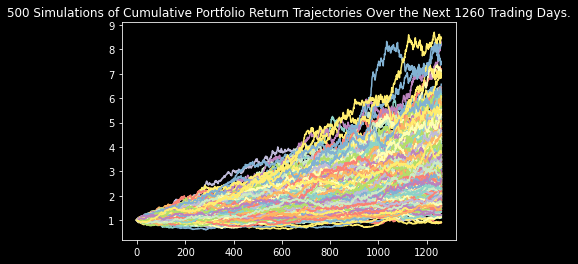

In [20]:
line_plot = MC_five_year.plot_simulation()
line_plot.get_figure().savefig("MC_fiveyear.png", bbox_inches="tight")

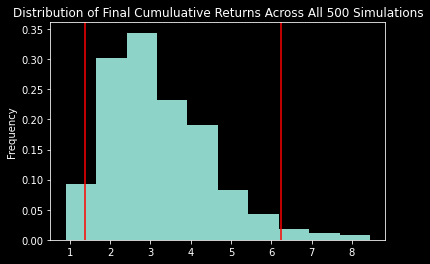

In [21]:
dist_plot = MC_five_year.plot_distribution()
dist_plot.get_figure().savefig("MC_fiveyear_distribution.png", bbox_inches="tight")

In [22]:
table = MC_five_year.summarize_cumulative_return()
table

count           500.000000
mean              3.219211
std               1.286377
min               0.898352
25%               2.275253
50%               2.944378
75%               4.030063
max               8.451702
95% CI Lower      1.372974
95% CI Upper      6.235173
Name: 1260, dtype: float64

In [28]:
table[-3]

8.451701985604899

In [23]:
# 50/50 KO/MSFT portfolio, results: 13729.74 62351.73
ci_lower = round(table[-2]*10000, 2)
ci_upper = round(table[-1]*10000, 2)

print(ci_lower,ci_upper)

13729.74 62351.73


In [16]:
# 60/40 KO/MSFT portfolio, results: 11109.09 54558.48
ci_lower = round(table[-2]*10000, 2)
ci_upper = round(table[-1]*10000, 2)

print(ci_lower,ci_upper)

11109.09 54558.48
